<a href="https://colab.research.google.com/github/ykato27/TensorFlow-Similarity-Sample/blob/main/TensorFlow_Similarity_Sample_02.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# TensorFlow Similarity インストール

In [1]:
!pip install tensorflow_similarity==0.13.26

     |████████████████████████████████| 138 kB 11.3 MB/s 
     |████████████████████████████████| 13.5 MB 69 kB/s 
     |████████████████████████████████| 80 kB 6.9 MB/s 
     |████████████████████████████████| 4.0 MB 43.4 MB/s 
     |████████████████████████████████| 188 kB 49.0 MB/s 
     |████████████████████████████████| 1.1 MB 27.6 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.1-py3-none-any.whl size=76564 sha256=6cd7da81b4553c746c9e1a3371bd9d566f5b13ec871575eb55d0bb32114ccda4
  Stored in directory: /root/.cache/pip/wheels/01/e7/bb/347dc0e510803d7116a13d592b10cc68262da56a8eec4dd72f
  Created wheel for pynndescent: filename=pynndescent-0.5.4-py3-none-any.whl size=52373 sha256=4b03d5da18c2952475ce9f119249df30b4c893343f80e7df9f5fb79b26aecadc
  Stored in directory: /root/.cache/pip/wheels/d0/5b/62/3401692ddad12324249c774c4b15ccb046946021e2b581c043
Successfully built umap-learn pynndescent
  Attempting uninstall: tensorflow-datasets
    Found existing installation: tens

# インポート

In [2]:
import numpy as np
import tensorflow as tf

In [3]:
import tensorflow_similarity
from tensorflow_similarity.layers import MetricEmbedding
from tensorflow_similarity.losses import MultiSimilarityLoss
from tensorflow_similarity.models import SimilarityModel
from tensorflow_similarity.samplers import MultiShotMemorySampler
from tensorflow_similarity.samplers import select_examples
from tensorflow_similarity.utils import tf_cap_memory
from tensorflow_similarity.visualization import confusion_matrix
from tensorflow_similarity.visualization import viz_neigbors_imgs

In [4]:
print("TensorFlow:", tf.__version__)
print("TensorFlow Similarity", tensorflow_similarity.__version__)

TensorFlow: 2.6.0
TensorFlow Similarity 0.13.26


# TensorFlowがメモリを占有することを防止

In [5]:
tf_cap_memory()

Physical devices cannot be modified after being initialized


# MNISTデータロード

In [6]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.mnist.load_data()

11501568/11490434 [==============================] - 0s 0us/step


In [7]:
# ラベル「9」以外を学習対象にする
CLASSES = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9]
NUM_CLASSES = 9
CLASS_PER_BATCH = NUM_CLASSES
STEPS_PER_EPOCH = 1000

sampler = MultiShotMemorySampler(
    x_train,
    y_train,
    classes_per_batch=CLASS_PER_BATCH,
    class_list=CLASSES[:NUM_CLASSES],
    steps_per_epoch=STEPS_PER_EPOCH,
)


Batch size is 18 (9 class X 2 example per class pre-augmentation


filtering examples:   0%|          | 0/60000 [00:00<?, ?it/s]

selecting classes:   0%|          | 0/9 [00:00<?, ?it/s]

indexing classes:   0%|          | 0/54051 [00:00<?, ?it/s]

# モデル構築

In [8]:
embedding_size = 128


def create_model():
    inputs = tf.keras.layers.Input(shape=(28, 28, 1))
    x = tf.keras.layers.experimental.preprocessing.Rescaling(1 / 255)(inputs)

    x = tf.keras.layers.Conv2D(32, 7, activation="relu")(x)
    x = tf.keras.layers.Conv2D(32, 3, activation="relu")(x)
    x = tf.keras.layers.MaxPool2D()(x)
    x = tf.keras.layers.Conv2D(64, 7, activation="relu")(x)
    x = tf.keras.layers.Conv2D(64, 3, activation="relu")(x)
    x = tf.keras.layers.Flatten()(x)
    x = tf.keras.layers.Dense(embedding_size, activation="relu")(x)

    outputs = MetricEmbedding(embedding_size)(x)

    return SimilarityModel(inputs, outputs)

In [9]:
model = create_model()
model.summary()

Model: "similarity_model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 28, 28, 1)]       0         
_________________________________________________________________
rescaling (Rescaling)        (None, 28, 28, 1)         0         
_________________________________________________________________
conv2d (Conv2D)              (None, 22, 22, 32)        1600      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 20, 20, 32)        9248      
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 10, 10, 32)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 4, 4, 64)          100416    
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 2, 2, 64)     

In [10]:
distance = "cosine"  # ["cosine", "L2", "L1"]
loss = MultiSimilarityLoss(distance=distance)

In [11]:
lr = 0.0001

model.compile(
    optimizer=tf.keras.optimizers.Adam(lr),
    loss=loss,
)

Distance metric automatically set to cosine use the distance arg to override.


# モデル訓練

In [12]:
epochs = 50

history = model.fit(sampler, epochs=epochs, validation_data=(x_test, y_test))

Epoch 1/50
1000/1000 [==============================] - 38s 9ms/step - loss: 0.8613 - val_loss: 1.2566
Warmup complete
Epoch 2/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.5543 - val_loss: 1.0728
Epoch 3/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.3850 - val_loss: 0.9774
Epoch 4/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.2869 - val_loss: 0.8759
Epoch 5/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.2401 - val_loss: 0.9247
Epoch 6/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.1867 - val_loss: 0.9294
Epoch 7/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.1893 - val_loss: 0.8483
Epoch 8/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.1417 - val_loss: 0.8760
Epoch 9/50
1000/1000 [==============================] - 8s 8ms/step - loss: 0.1320 - val_loss: 0.8778
Epoch 10/50
1000/1000 [==============================] - 8s 8ms/s

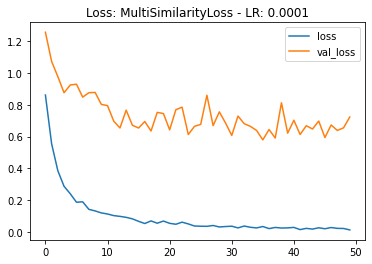

In [13]:
from matplotlib import pyplot as plt


plt.plot(history.history["loss"])
plt.plot(history.history["val_loss"])
plt.legend(["loss", "val_loss"])
plt.title(f"Loss: {loss.name} - LR: {lr}")
plt.show()

# インデックス構築

In [14]:
model.reset_index()
model.index(
    np.array([x_train[22]]),
    np.array([y_train[22]]),
    data=np.array([x_train[22]]),
)
print(y_train[22])

[Indexing 1 points]
|-Computing embeddings
|-Storing data points in key value store
|-Adding embeddings to index.
|-Building index.
9


# モデル保存/読み込み

In [15]:
# save the model and the index
save_path = "saved_model"
model.save(save_path)

INFO:tensorflow:Assets written to: saved_model/assets


INFO:tensorflow:Assets written to: saved_model/assets


In [16]:
# reload the model
loaded_model = tf.keras.models.load_model(save_path)
# reload the index
loaded_model.load_index(save_path)

Distance metric automatically set to cosine use the distance arg to override.
Loading index data
loaded 1 records from saved_model/index
Loading search index


# 推論確認

filtering examples:   0%|          | 0/10000 [00:00<?, ?it/s]

selecting classes:   0%|          | 0/10 [00:00<?, ?it/s]


Performing NN search



Building NN list:   0%|          | 0/10 [00:00<?, ?it/s]

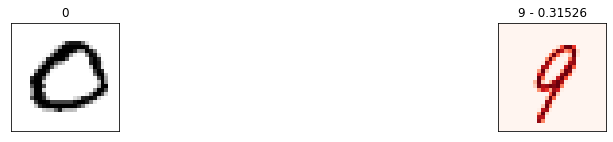

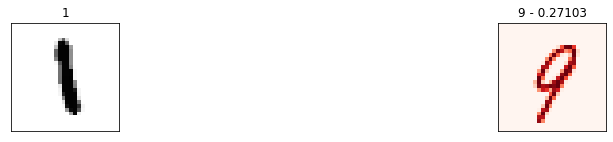

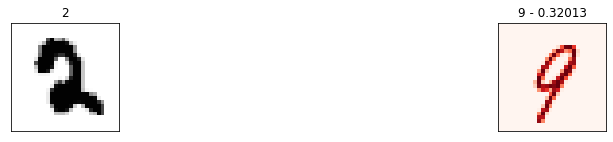

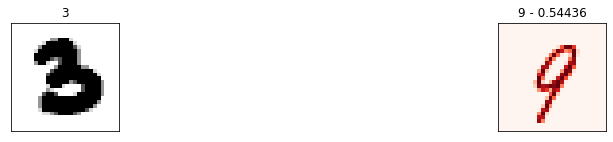

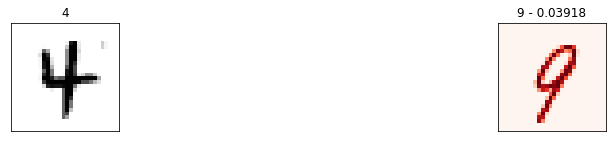

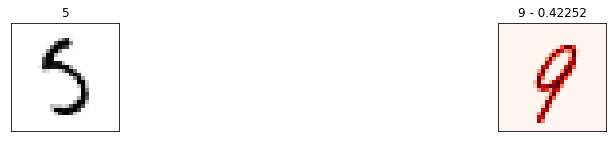

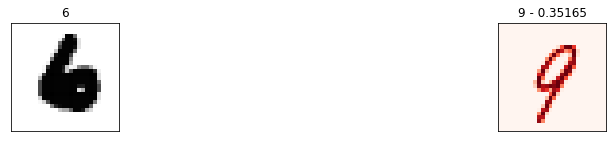

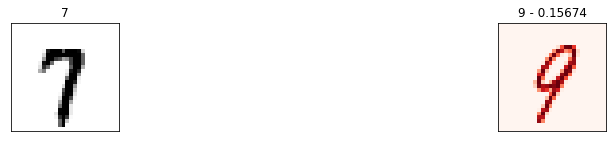

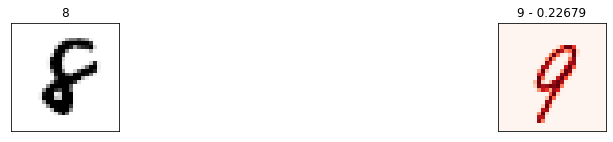

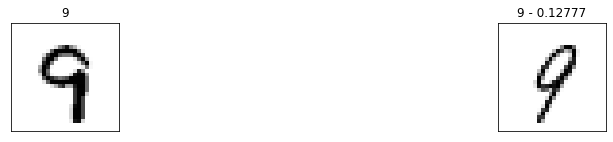

In [17]:
# used to label in images in the viz_neighbors_imgs plots
# note we added a 11th classes for unknown
labels = ["0", "1", "2", "3", "4", "5", "6", "7", "8", "9"]

# re-run to test on other examples
num_neighboors = 5

# select
x_display, y_display = select_examples(x_test, y_test, CLASSES, 1)

# lookup nearest neighbors in the index
nns = loaded_model.lookup(x_display, k=num_neighboors)

# display
for idx in np.argsort(y_display):
    viz_neigbors_imgs(
        x_display[idx],
        y_display[idx],
        nns[idx],
        class_mapping=labels,
        fig_size=(16, 2),
        cmap="Greys",
    )

# UMAPによる可視化

In [18]:
from tensorflow_similarity.visualization import projector


projector(
    loaded_model.predict(x_test),
    labels=y_test,
    images=x_test,
    class_mapping={
        0: "0",
        1: "1",
        2: "2",
        3: "3",
        4: "4",
        5: "5",
        6: "6",
        7: "7",
        8: "8",
        9: "9",
    },
    image_size=64,
    plot_size=800,
)

perfoming projection using UMAP


/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


generating diplayabe images:   0%|          | 0/10000 [00:00<?, ?it/s]

# single_lookup()確認

In [19]:
%%time
nns = loaded_model.single_lookup(x_test[7], k=1)

print(y_test[7])
print(nns[0].label, nns[0].distance)

9
9 0.08787298202514648
CPU times: user 65 ms, sys: 9.09 ms, total: 74.1 ms
Wall time: 77.9 ms
